<a href="https://colab.research.google.com/github/mariafadilla15/PCVK_Genap_2023/blob/main/Week10_Kelompok7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **KELOMPOK 7**

# **Week 10 - Tresholding**

# **PRAKTIKUM**

## 1. Buka https://colab.research.google.com/.

Setelah dipastikan bahwa google Colab terhubung dengan Github Anda, lanjutkan dengan memilih repository yang telah digunakan pada praktikum minggu lalu, rename file menjadi “Week10.ipynb”.

Kemudian import folder yang ada di Drive Anda dengan cara sebagai berikut.

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 2. Import Library

Import beberapa library berikut yang akan digunakan selama uji coba praktikum minggu ke-6 berikut.

In [ ]:
import cv2
import numpy as np
import pytesseract
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image

## 3. Membuat Global Threshold

Buat Global Threshold (BINARY, BINARY_INV, TRUNC, TOZERO, TOZERO_INV), dengan threshold= 170, secara manual sesuai dengan deskripsi dari grafik yang ditunjukkan di bawah

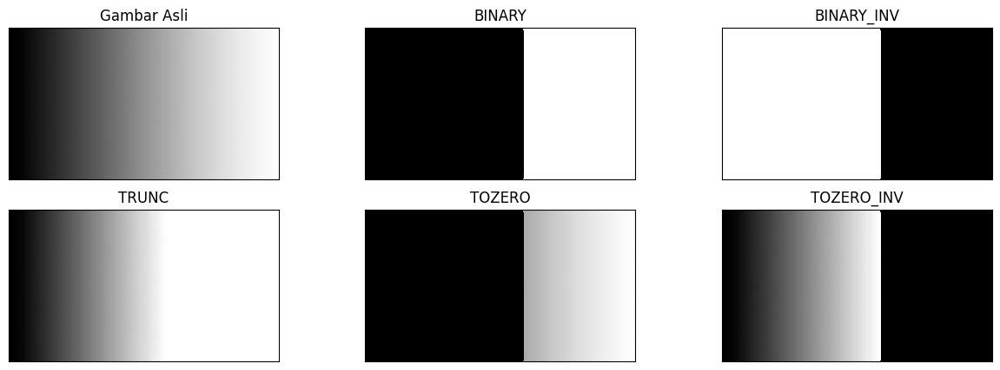

In [ ]:
# tanpa menggunakan library

# Baca gambar dengan PIL
filename = '/content/drive/MyDrive/Colab Notebooks/Week10/image_thres/gradient.jpg'
img = Image.open(filename)
img = img.convert("L")  # Ubah ke citra ke skala abu-abu (grayscale)

thresh = 170  # Nilai threshold yang ditentukan

# Fungsi untuk melakukan thresholding
def thresholding(image, threshold):
    # Ubah gambar ke array numpy
    img_array = np.array(image)

    # Lakukan thresholding untuk setiap metode
    binary = np.where(img_array > threshold, 255, 0).astype(np.uint8)
    binary_inv = np.where(img_array > threshold, 0, 255).astype(np.uint8)
    trunc = np.where(img_array > threshold, threshold, img_array).astype(np.uint8)
    tozero = np.where(img_array > threshold, img_array, 0).astype(np.uint8)
    tozero_inv = np.where(img_array > threshold, 0, img_array).astype(np.uint8)

    # Ubah array numpy kembali ke gambar PIL
    binary_img = Image.fromarray(binary)
    binary_inv_img = Image.fromarray(binary_inv)
    trunc_img = Image.fromarray(trunc)
    tozero_img = Image.fromarray(tozero)
    tozero_inv_img = Image.fromarray(tozero_inv)

    return binary_img, binary_inv_img, trunc_img, tozero_img, tozero_inv_img

# Lakukan thresholding
binary, binary_inv, trunc, tozero, tozero_inv = thresholding(img, thresh)

# Tampilkan gambar hasil thresholding
titles = ['Gambar Asli', 'BINARY', 'BINARY_INV', 'TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, binary, binary_inv, trunc, tozero, tozero_inv]

plt.figure(figsize=(15, 5))
for i in range(len(images)):
    plt.subplot(2, 3, i + 1)
    plt.imshow(images[i], cmap='gray', interpolation='nearest')
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])

plt.show()

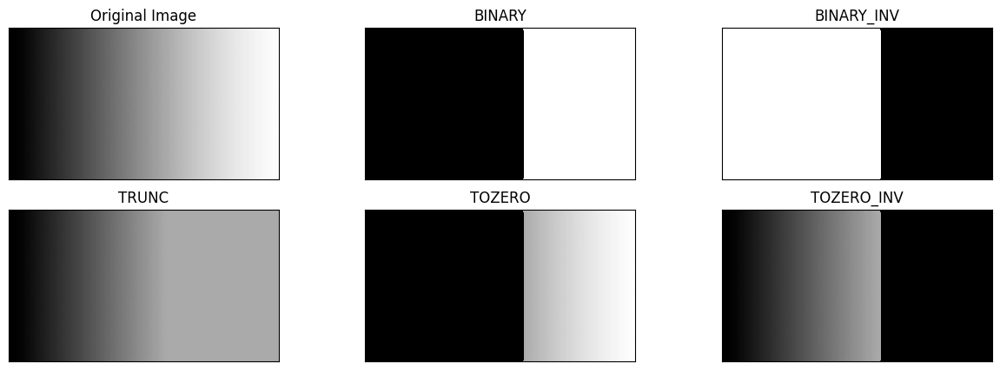

In [ ]:
# Code Berikut menunjukkan penggunaan dari library OpenCV cv.Threshold

filename = ('/content/drive/MyDrive/Colab Notebooks/Week10/image_thres/gradient.jpg')
img = cv2.imread(filename)
thresh = 170 #nilai Threshold yang ditentukan
#1. thresh1 jika pixel di img>127, maka thresh1 bernilai 1(putih) selain itu bernilai 0(hitam)
ret,thresh1 = cv2.threshold(img,thresh,255,cv2.THRESH_BINARY)
#2. thresh2 adalah binary threshold inverse
ret,thresh2 = cv2.threshold(img,thresh,255,cv2.THRESH_BINARY_INV)
#3. Threshold Truncate
ret,thresh3 = cv2.threshold(img,thresh,255,cv2.THRESH_TRUNC)
#4. Threshold Tozero
ret,thresh4 = cv2.threshold(img,thresh,255,cv2.THRESH_TOZERO)
#5. Threshold Tozero Inverse
ret,thresh5 = cv2.threshold(img,thresh,255,cv2.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC', 'TOZERO', 'TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
plt.figure(figsize = (15,5))
for i in range(len(images)):
 plt.subplot(2,3,i+1), plt.imshow(images[i], 'gray', interpolation='nearest')
 plt.title(titles[i])
 plt.xticks([]),plt.yticks([])
plt.show()

## 4. Membuat Otsu Thresholding tanpa Library

Buat Otsu Thresholding tanpa menggunakan Library. Tampilkan juga nilai threshold saat anda gunakan Otsu’s, seperti terlihat pada gambar hasil berikut. (gunakan image ktp Riyanto.jpg agar terlihat beda antara hasil otsu’s dengan global threshold biasa)

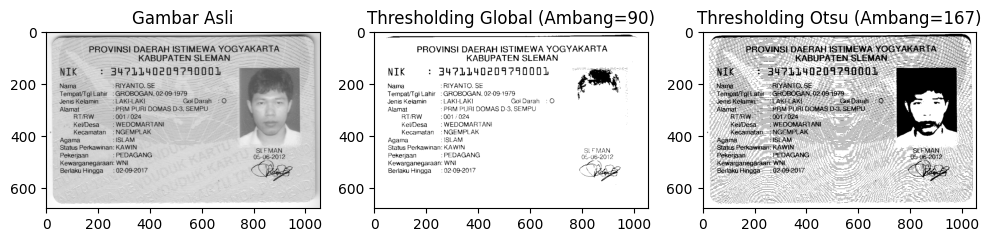

In [ ]:
# Membaca gambar dalam mode grayscale
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Week10/image_thres/ktp Riyanto.png', cv2.IMREAD_GRAYSCALE)

# Menghitung histogram dari gambar
histogram = cv2.calcHist([image], [0], None, [256], [0, 256])

# Fungsi untuk menghitung nilai ambang Otsu
def otsu_threshold(histogram):
    # Menghitung total piksel dalam gambar
    total_pixels = np.sum(histogram)
    max_var = 0
    threshold = 0

    # Iterasi untuk setiap intensitas piksel
    for t in range(256):
        # Menghitung total piksel latar belakang dan objek
        background_pixels = np.sum(histogram[:t])
        foreground_pixels = np.sum(histogram[t:])

        # Jika jumlah piksel latar belakang atau objek adalah 0, lanjutkan ke iterasi berikutnya
        if background_pixels == 0 or foreground_pixels == 0:
            continue

        # Menghitung bobot latar belakang dan objek
        background_weight = background_pixels / total_pixels
        foreground_weight = foreground_pixels / total_pixels

        # Menghitung rata-rata intensitas latar belakang dan objek
        mean_background = np.sum(np.arange(t) * histogram[:t]) / background_pixels
        mean_foreground = np.sum(np.arange(t, 256) * histogram[t:]) / foreground_pixels

        # Menghitung varians antar kelas
        variance_between_classes = background_weight * foreground_weight * (mean_background - mean_foreground) ** 2

        # Jika varians ini lebih besar dari varians sebelumnya, perbarui varians maksimum dan ambang batas
        if variance_between_classes > max_var:
            max_var = variance_between_classes
            threshold = t

    return threshold

# Menetapkan nilai ambang Otsu dan Global secara manual
otsu_thresh = 167
global_thresh = 90

# Menerapkan thresholding Otsu dan Global ke gambar
otsu_result = (image > otsu_thresh).astype(np.uint8) * 255
global_result = (image > global_thresh).astype(np.uint8) * 255

# Menampilkan gambar asli dan hasil thresholding
plt.figure(figsize=(12, 4))
plt.subplot(131), plt.imshow(image, cmap='gray'), plt.title('Gambar Asli')
plt.subplot(132), plt.imshow(global_result, cmap='gray'), plt.title(f'Thresholding Global (Ambang={global_thresh})')
plt.subplot(133), plt.imshow(otsu_result, cmap='gray'), plt.title(f'Thresholding Otsu (Ambang={otsu_thresh})')
plt.show()

## 5. Membuat Histogram Citra Tersegmentasi

Buat histogram dari citra tersegmentasi, Histogram hanya pada foreground image saja. Gunakan image ktp Riyanto.jpg yang sudah disediakan di folder images.

Petunjuk:

a. anda dapat gunakan cv.calcHist untuk menampilkan histogram.

b. Buka link berikut https://opencv-tutorial.readthedocs.io/en/latest/histogram/histogram.html

c. Dari link tersebut perhatikan bahwa cv.calcHist memiliki salah satu parameter yaitu mask. Jika diset None, maka keseluruhan image akan dihitung histogramnya. Jika kita tentukan mask, maka hanya bagian image yang dimasking warna putih yang akan dihitung histogramnya (dari contoh dibawah dinamakan dengan Citra Segment).

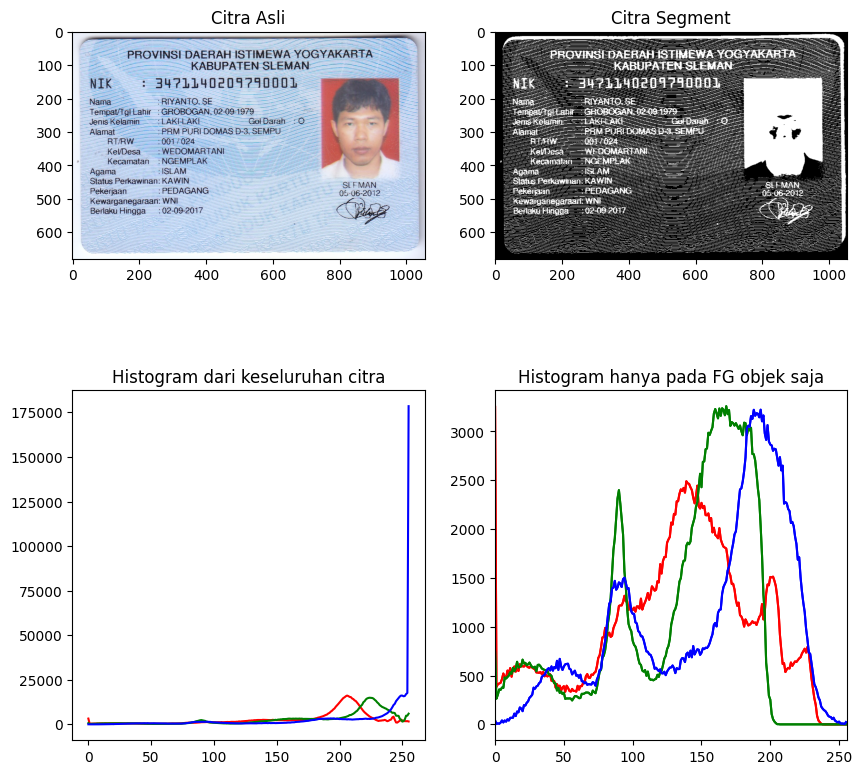

In [ ]:
# Buat histogram dari citra tersegmentasi, Histogram hanya pada foreground image saja
filename_3 = ('/content/drive/MyDrive/PCVK/ktp Riyanto.png')
img_l = cv2.imread(filename_3)
img_rgb = cv2.cvtColor(img_l,cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_rgb,cv2.COLOR_BGR2GRAY)

ret3,mask = cv2.threshold(img_gray,200,255,cv2.THRESH_BINARY_INV)

plt.figure(figsize = (10,10))
plt.subplot(2,2,1),plt.imshow(img_rgb)
plt.title('Citra Asli')
plt.subplot(2,2,2),plt.imshow(mask, 'gray')
plt.title('Citra Segment')
color = ('r','g','b')

for i,col in enumerate(color):
    hist0 = cv2.calcHist([img_rgb],[i],None,[256],[0,256])
    plt.subplot(2,2,3),plt.plot(hist0,color = col)
    plt.title('Histogram dari keseluruhan citra')
    hist1 = cv2.calcHist([img_rgb],[i],mask,[256],[0,256])
    plt.subplot(2,2,4),plt.plot(hist1,color = col)
    plt.title('Histogram dari keseluruhan citra')
    hist1 = cv2.calcHist([img_rgb],[i],mask,[256],[0,256])
    plt.subplot(2,2,4),plt.plot(hist1,color = col)
    plt.title('Histogram hanya pada FG objek saja')
    plt.xlim([0,256])

plt.show()

## 6. Melakukan Segmentasi Warna

Lakukan segmentasi warna pada image " ktp Riyanto.jpg ", munculkan hanya warna yang biru saja. (Petunjuk: anda dapat gunakan K-Means untuk menampilkan hanya warna tertentu saja)

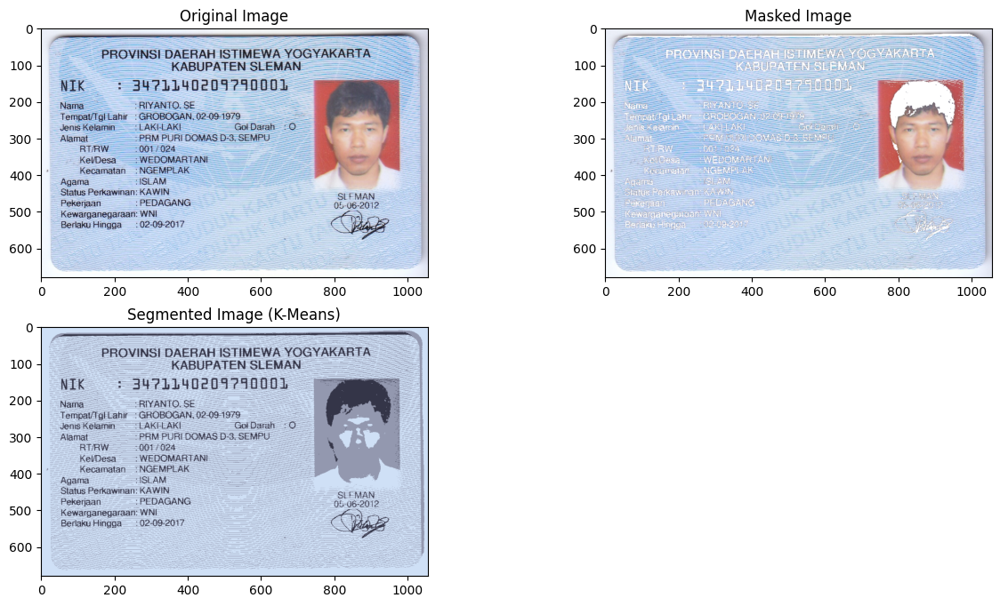

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
filename = '/content/drive/MyDrive/PCVK/ktp Riyanto.png'
img = cv2.imread(filename)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Flatten the pixel values
pixel_values = img.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

# Define the criteria and the number of clusters (k)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3# Number of clusters

# Apply K-Means clustering
_, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convert the centers to integers
centers = np.uint8(centers)

# Flatten the labels array
labels = labels.flatten()

# Create a masked image by turning one cluster into white
masked_image = np.copy(img)
masked_image = masked_image.reshape((-1, 3))
cluster_to_white = 2
masked_image[labels == cluster_to_white] = [255, 255, 255]
masked_image = masked_image.reshape(img.shape)

# Convert the segmented image back to the original shape
segmented_image = centers[labels].reshape(img.shape)

# Display the original image, segmented image, and masked image
plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1), plt.imshow(img)
plt.title('Original Image')

plt.subplot(2, 2, 2), plt.imshow(masked_image)
plt.title('Masked Image')

plt.subplot(2, 2, 3), plt.imshow(segmented_image)
plt.title('Segmented Image (K-Means)')

plt.show()

# **TUGAS**

Tugasnya adalah mengimplementasikan thresholding dengan beberapa metode yang telah Anda ketahui untuk melakukan segmentasi pada dataset KTP pertemuan 7.

### Import Library dan Load Image

In [90]:
# Import Library

import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from sklearn.cluster import KMeans
import os

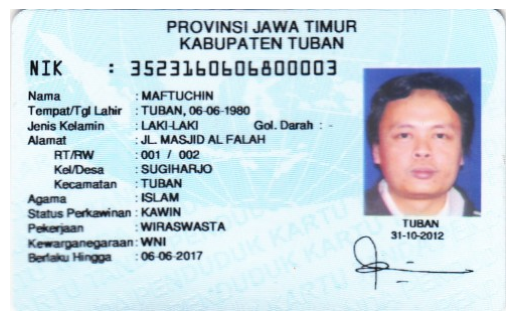

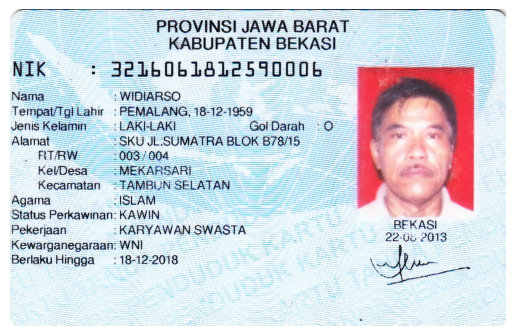

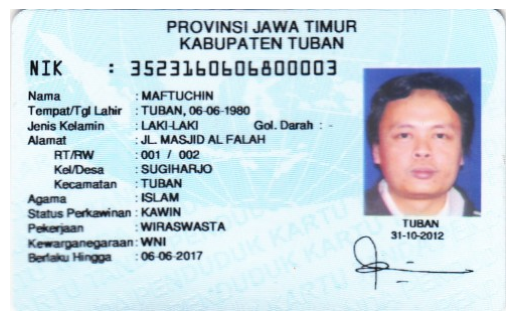

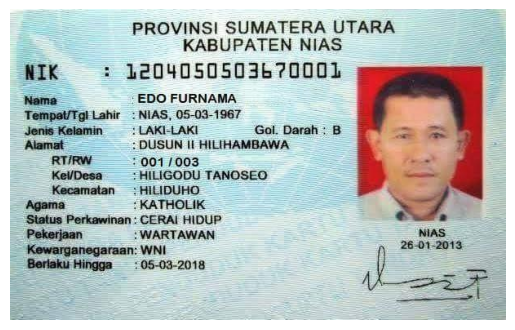

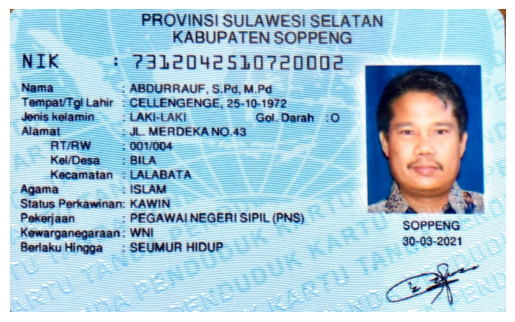

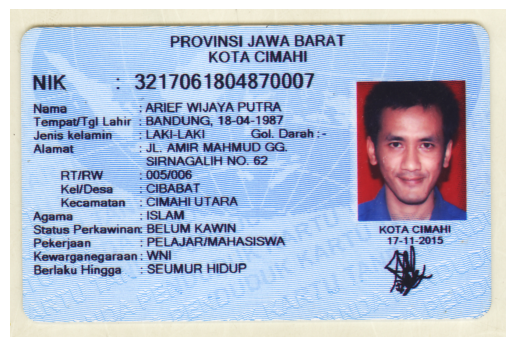

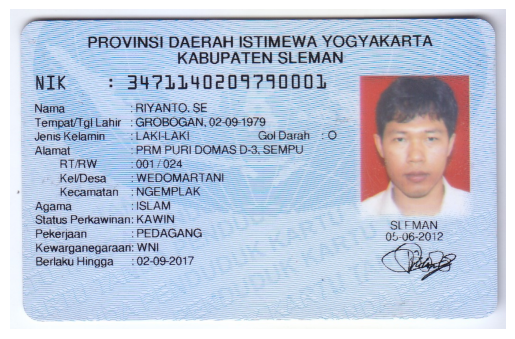

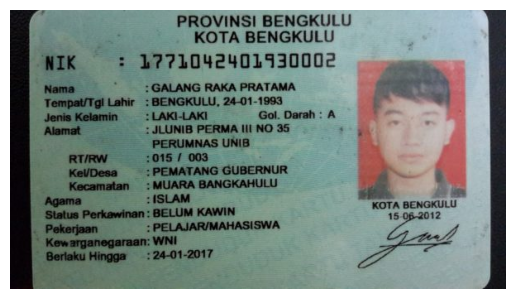

In [91]:
images = '/content/drive/MyDrive/Colab Notebooks/Week9/KTP'

# Mengambil File dari Folder
image_files = [file for file in os.listdir(images) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop gambar
for img_file in image_files:
    img_path = os.path.join(images, img_file)

    img = cv2.imread(img_path)

# Menampilkan Gambar
    plt.figure()
    plt.axis('off')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()


### Global Thresholding

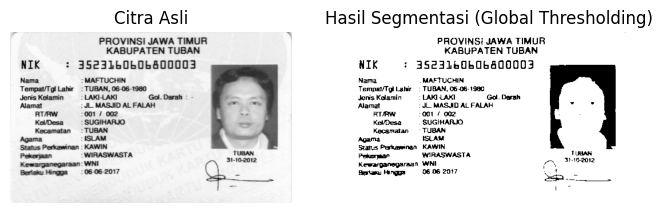

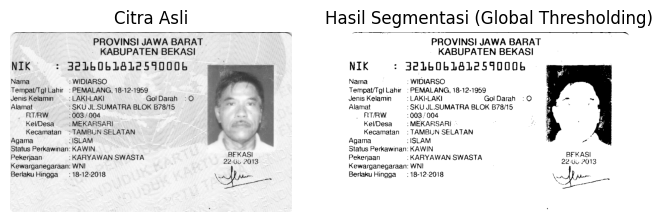

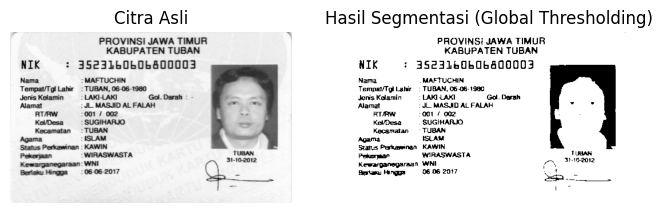

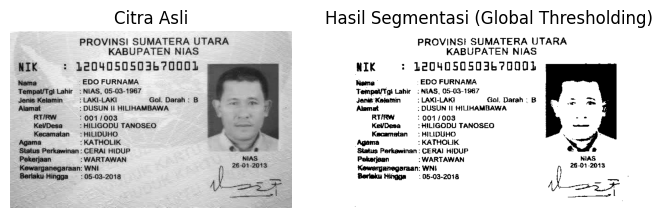

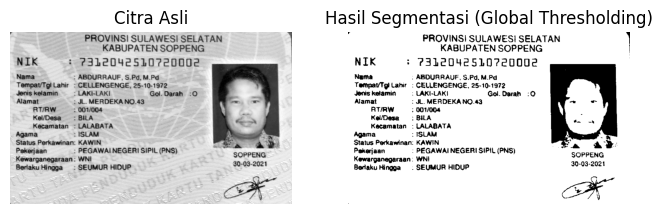

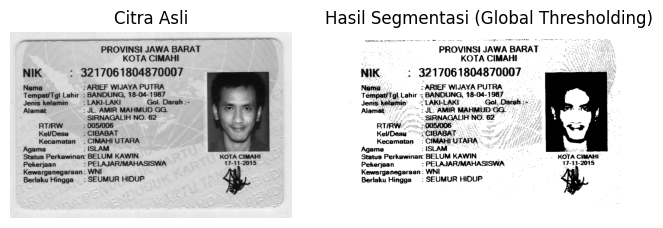

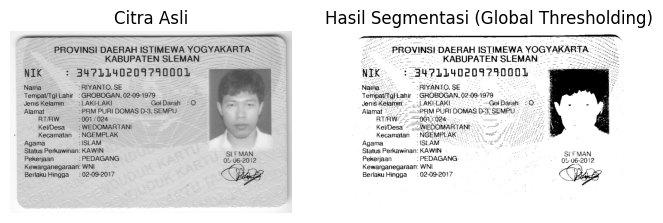

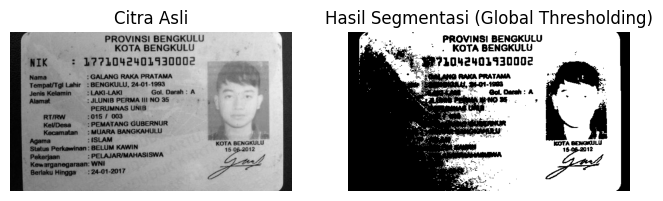

In [98]:
# Ambil File dari direktory
for img_file in image_files:
    img_path = os.path.join(images, img_file)

    # Buka gambar dan konversi ke grayscale
    img = Image.open(img_path).convert('L')

    # Global thresholding
    thresholded = img.point(lambda p: p > 127 and 255)

    # Menampilkan gambar asli dan hasil segmentasi
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Hasil Segmentasi (Global Thresholding)')
    plt.axis('off')

    plt.show()

### Adaptive Threshold

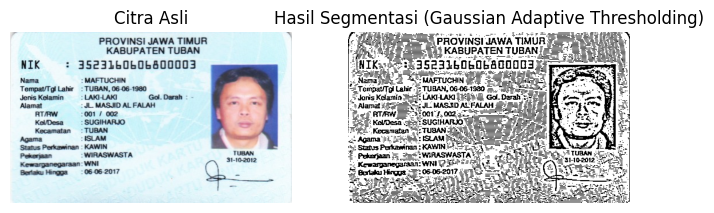

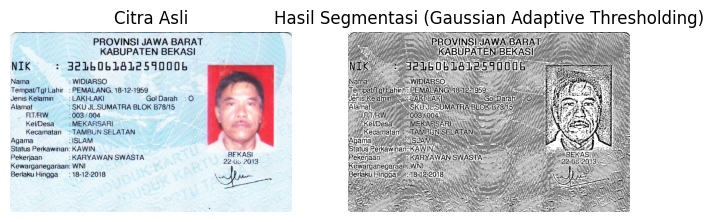

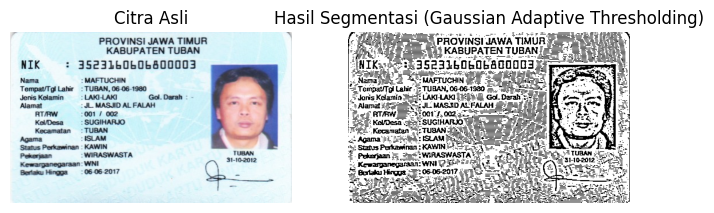

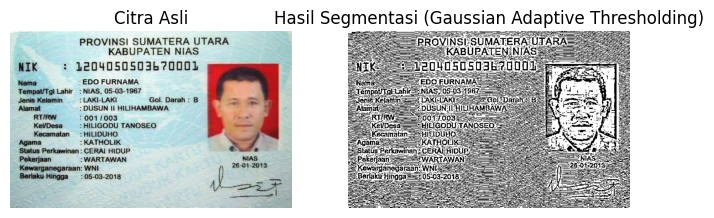

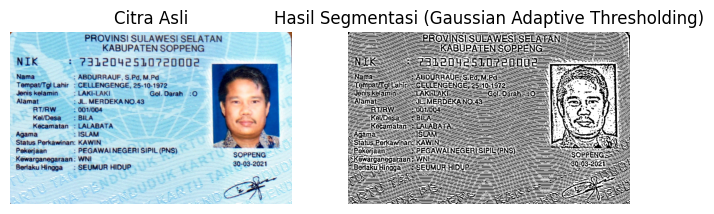

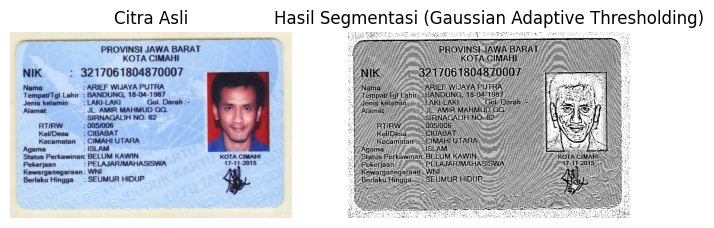

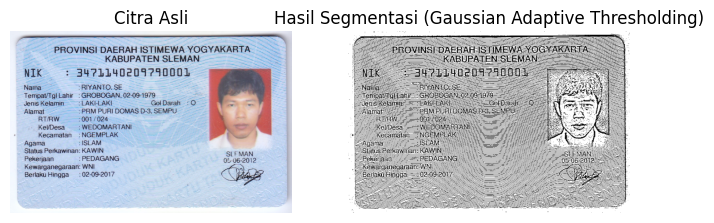

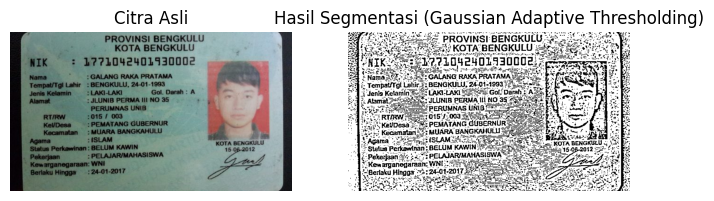

In [93]:
# Loop semua gambar
for img_file in image_files:
    img_path = os.path.join(images, img_file)

    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Gaussian Adaptive thresholding
    thresholded = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

    # Menampilkan gambar asli dan hasil segmentasi
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Hasil Segmentasi (Gaussian Adaptive Thresholding)')
    plt.axis('off')

    plt.show()

### Otsu's Threshold

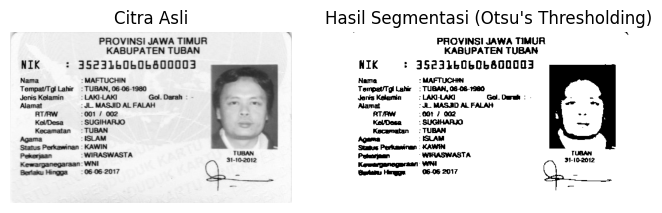

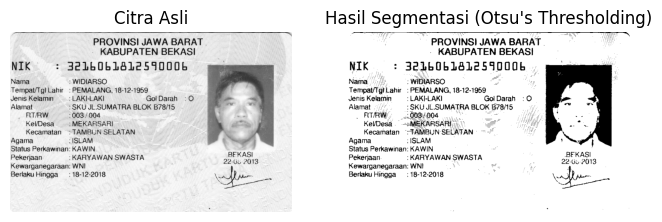

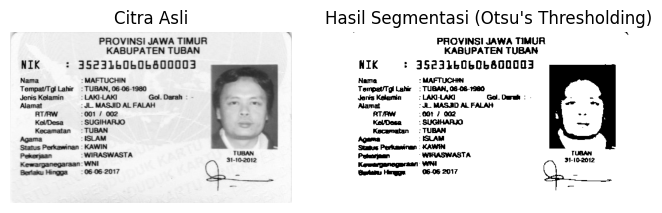

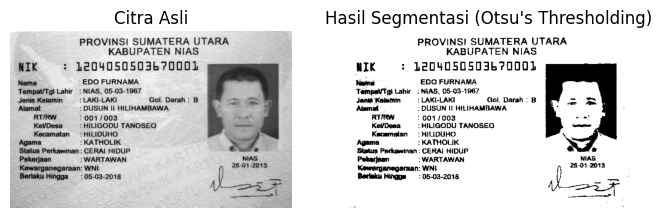

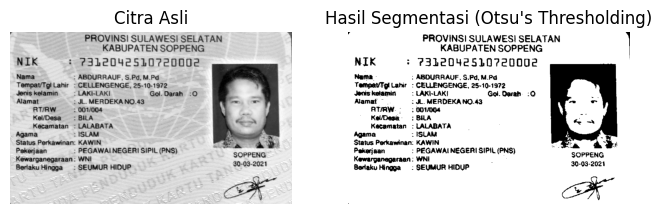

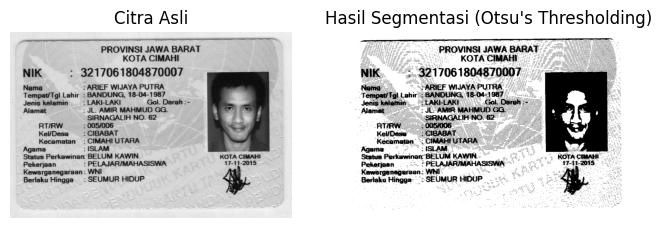

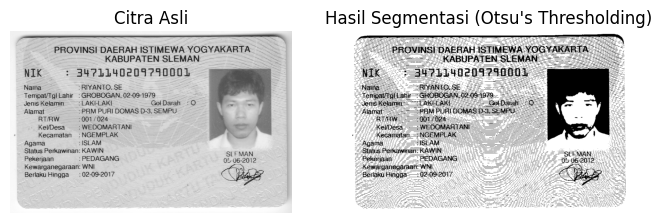

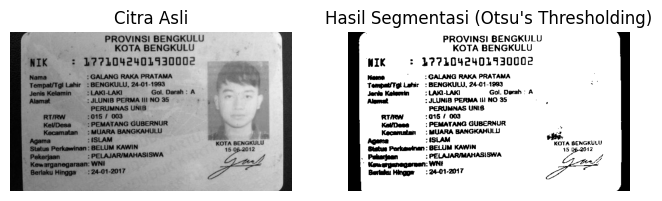

In [100]:
from PIL import Image
from skimage import filters

# Loop Semua gambar yang ada dalam direktory
for img_file in image_files:
    img_path = os.path.join(images, img_file)

    # Buka gambar dan konversi ke grayscale
    img = Image.open(img_path).convert('L')
    img = np.array(img)

    # Otsu's Thresholding
    threshold_value = filters.threshold_otsu(img)
    thresholded = img > threshold_value

    # Menampilkan gambar asli dan hasil segmentasi
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Hasil Segmentasi (Otsu\'s Thresholding)')
    plt.axis('off')

    plt.show()

### Pengenalan Segmentasi Citra menggunakan K-Means

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


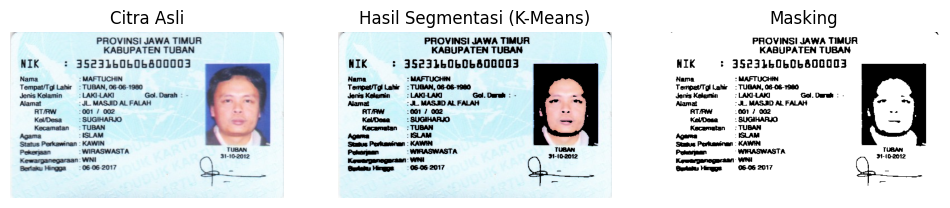

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


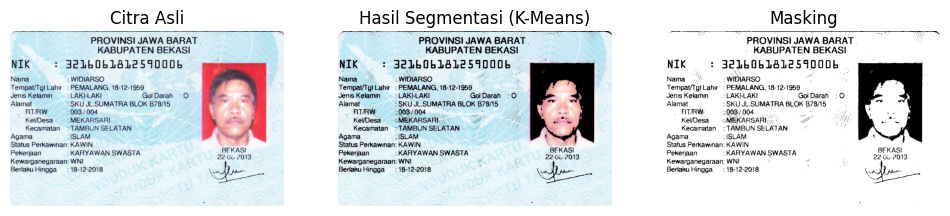

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


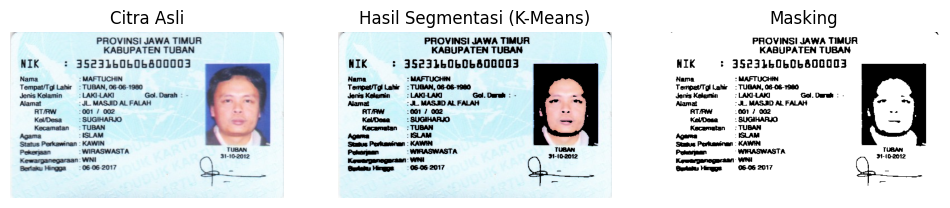

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


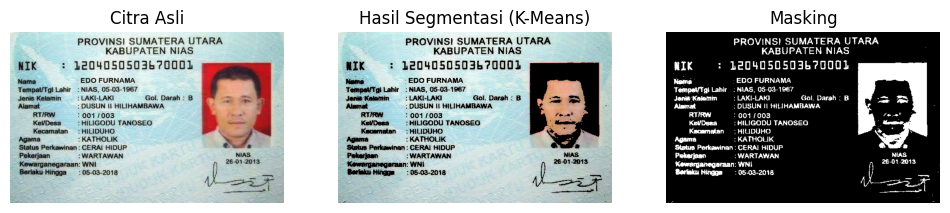

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


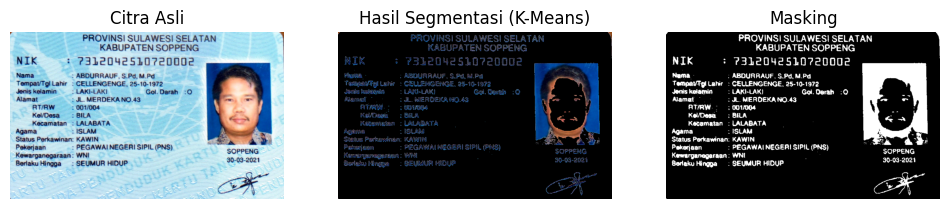

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


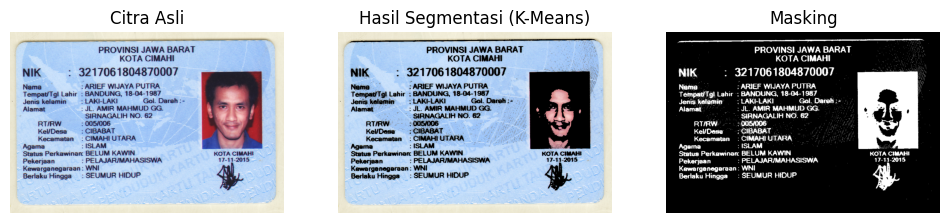

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


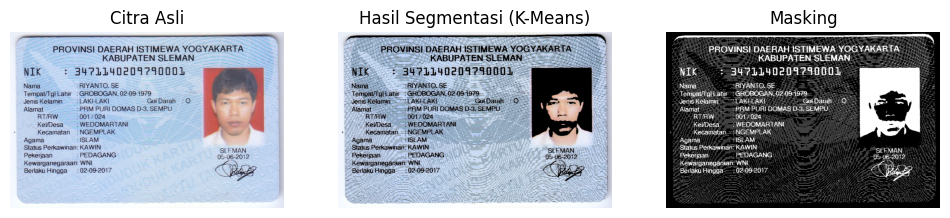

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


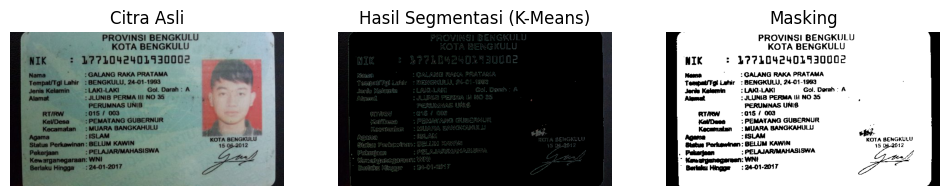

In [107]:
from sklearn.cluster import KMeans

def kmeans_segmentation(image):
    # Ubah citra ke format yang dapat dikerjakan oleh K-Means
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    # Terapkan K-Means clustering
    kmeans = KMeans(n_clusters=2, random_state=0)
    kmeans.fit(pixel_values)
    labels = kmeans.labels_.reshape(image.shape[0], image.shape[1])

    # Ambil nilai piksel dari kluster
    blue_cluster = labels[0, 0]
    segmented_image = np.zeros_like(image)
    segmented_image[labels == blue_cluster] = image[labels == blue_cluster]

    return segmented_image, labels

# Mengambil Gambar di dalam Folder
image_files = [file for file in os.listdir(images) if file.endswith((".jpg", ".jpeg", ".png"))]

# Loop melalui semua gambar
for img_file in image_files:
    img_path = os.path.join(images, img_file)

    img = cv2.imread(img_path)

    # Menggunakan K-Means untuk segmentasi
    segmented_image, labels = kmeans_segmentation(img)

    # Menampilkan gambar asli, hasil segmentasi, dan hasil masking
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Citra Asli')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
    plt.title('Hasil Segmentasi (K-Means)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(labels, cmap='gray')
    plt.title('Masking')
    plt.axis('off')

    plt.show()